Enter your OpenAI API Key: ··········
Please upload an image of a historical setting (like the Colosseum, ancient temple, etc.)


Saving BRASTOUR3.jpg to BRASTOUR3.jpg


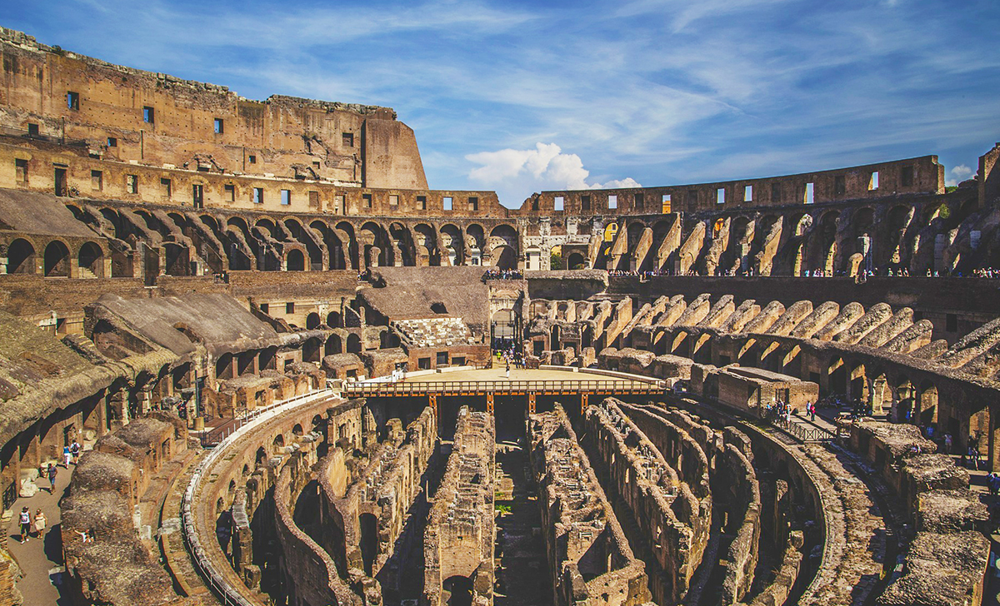

What is this historical setting? (e.g., Roman Colosseum): Roman Colosseum
What historical period is this from? (e.g., Ancient Rome, 2nd Century CE): Ancient Rome, 2nd century
What type of production is this for? (e.g., Feature Film, TV Series): Feature film
Describe a key scene that would take place here (e.g., Gladiator fighting scene): Crowd running on to the stadium 
Total production budget (USD, default: 100,000,000): 
Maximum physical set budget (USD, default: 10,000,000): 
Analyzing set requirements for Roman Colosseum...
Determining optimal physical vs. CGI construction plan...

===== CONSTRUCTION PLAN =====
Estimated cost: $9,000,000.00

Physical elements to build:
- central arena
- walkways
- gates

CGI elements:
- amphitheater stands
- arches
- upper seating levels
- stone walls

Reasoning:
To optimize the budget while ensuring authenticity in scenes requiring actor interaction, it is crucial to physically construct elements with which actors directly engage. The central aren

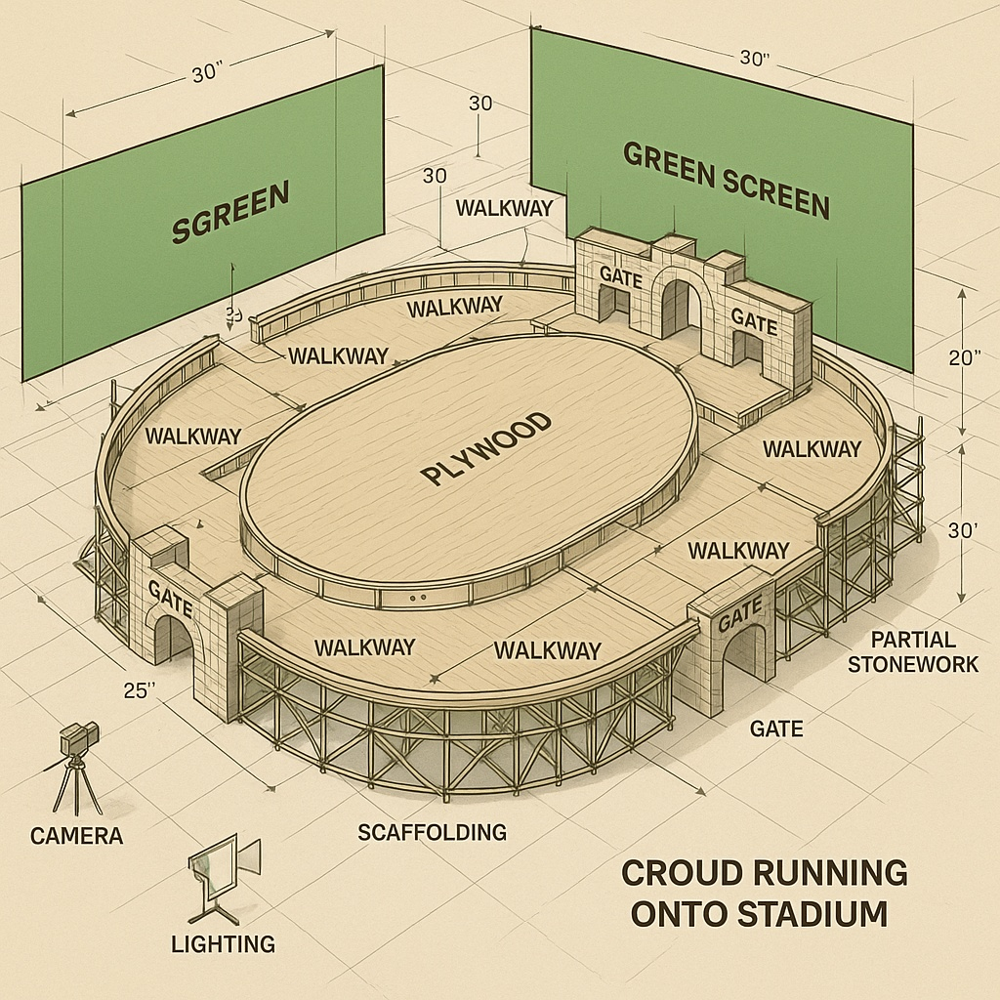


===== FINAL COMPOSITE WITH CGI =====
This shows the final film shot with all CGI elements added:


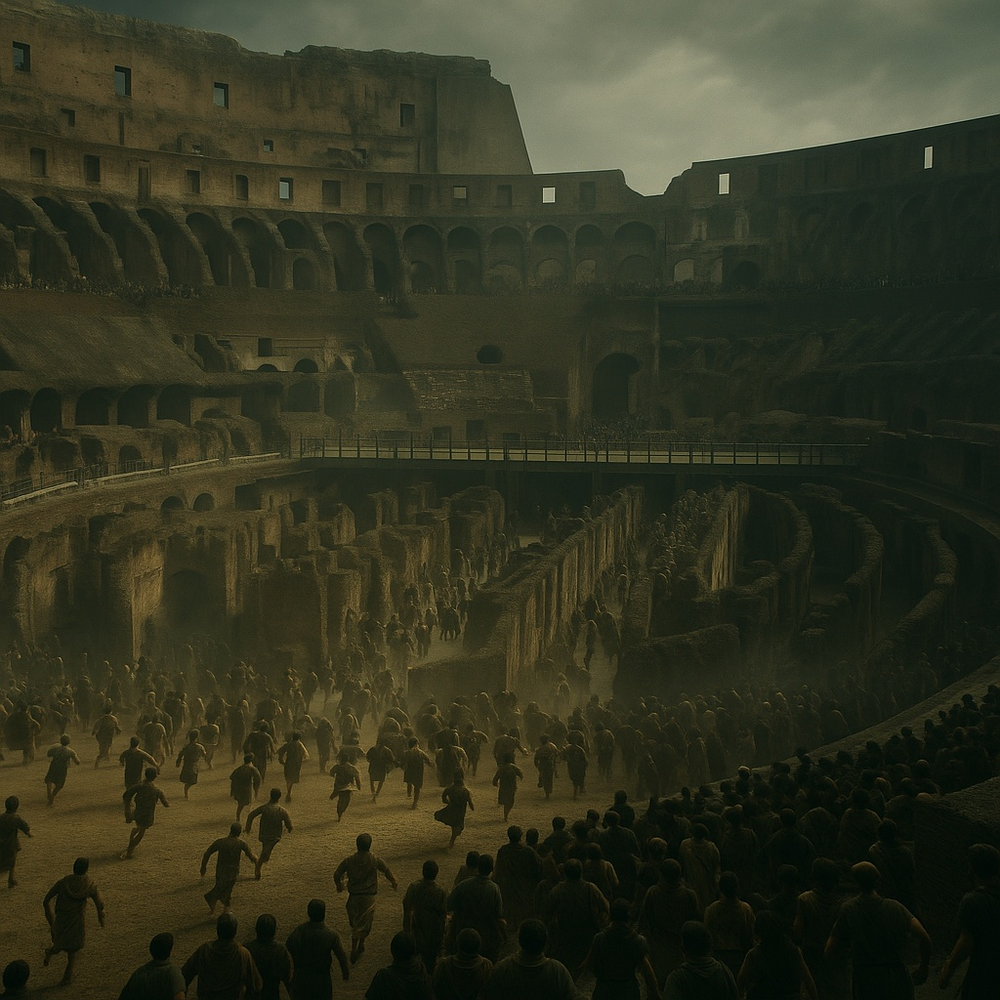


===== SIDE-BY-SIDE COMPARISON =====


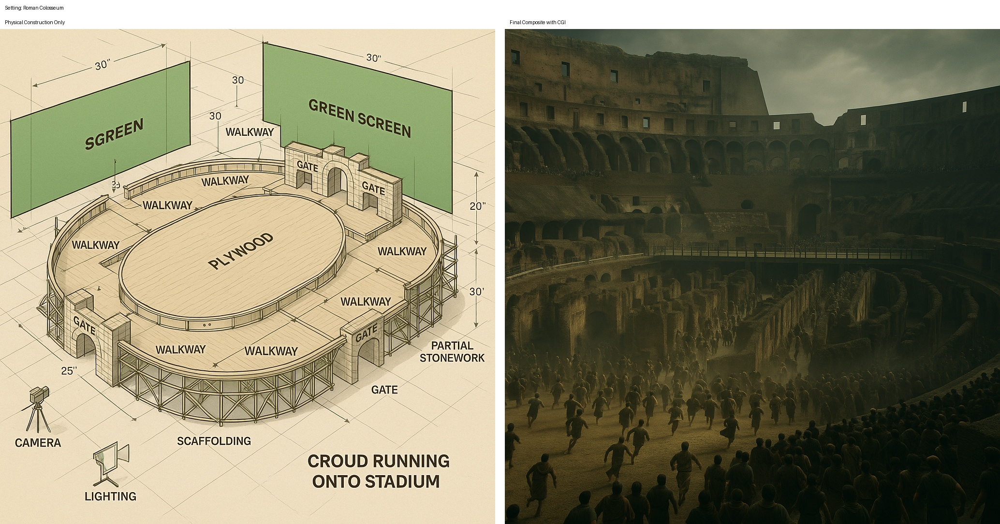


===== BUDGET ALLOCATION =====


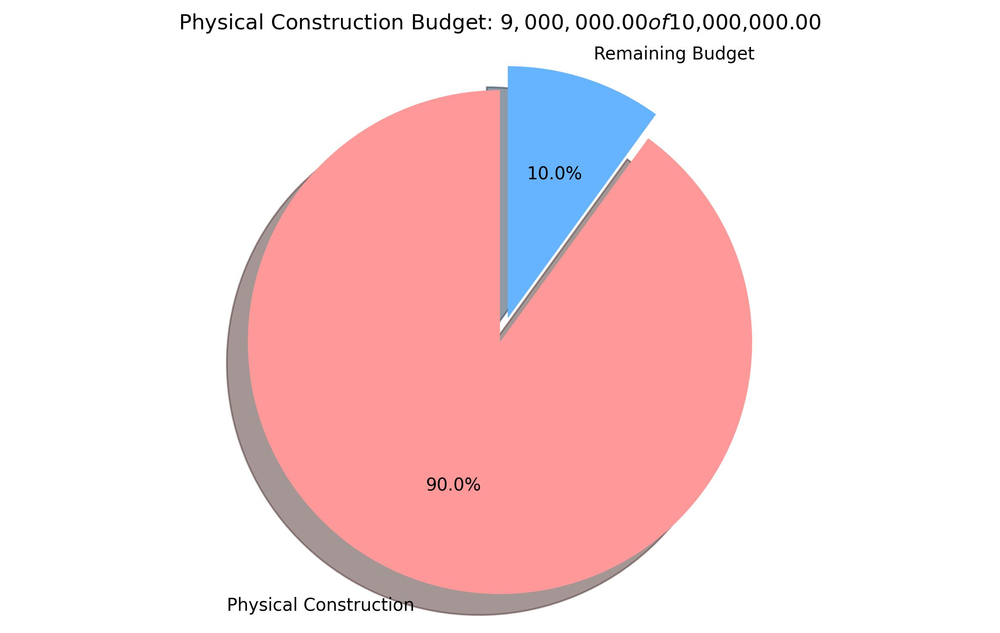

Generating summary report...
Summary report saved to output/set_optimization_report.html


Would you like to download all results? (yes/no): yes
updating: output/ (stored 0%)
updating: output/composite_shot.jpg (deflated 0%)
updating: output/set_optimization_report.html (deflated 68%)
updating: output/budget_chart.jpg (deflated 48%)
updating: output/physical_set.jpg (deflated 0%)
updating: output/set_comparison.jpg (deflated 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download initiated. If it doesn't start automatically, check your browser's download manager.


In [ ]:
"""
# Simplified Movie Set Optimization System

This notebook analyzes an uploaded image of a historical setting and creates:
1. A breakdown of what should be physical vs. CGI construction
2. Visualization of the minimal physical set needed
3. Visualization of the final composite with CGI elements added
"""

# Install required packages
!pip install openai pillow matplotlib numpy

# Import dependencies
import os
import json
import base64
from io import BytesIO
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from google.colab import files
from openai import OpenAI

# Create output directory
!mkdir -p output

"""## 1. Setup OpenAI API Key"""

# Set up OpenAI API Key (keep your key private)
import getpass

api_key = getpass.getpass('Enter your OpenAI API Key: ')
os.environ['OPENAI_API_KEY'] = api_key
client = OpenAI(api_key=os.environ['OPENAI_API_KEY'])

"""## 2. Upload Image of Historical Setting"""

print("Please upload an image of a historical setting (like the Colosseum, ancient temple, etc.)")
uploaded = files.upload()

# Get the uploaded image path and load it
uploaded_filename = list(uploaded.keys())[0]
image_path = uploaded_filename

# Load and display the image
reference_image = Image.open(image_path)
display(reference_image)

"""## 3. Enter Setting Information"""

# Get basic information about the setting
setting_name = input("What is this historical setting? (e.g., Roman Colosseum): ")
historical_period = input("What historical period is this from? (e.g., Ancient Rome, 2nd Century CE): ")
production_type = input("What type of production is this for? (e.g., Feature Film, TV Series): ")

# Define a sample scene for context
scene_description = input("Describe a key scene that would take place here (e.g., Gladiator fighting scene): ")

# Set budget constraints
try:
    total_budget = int(input("Total production budget (USD, default: 100,000,000): ") or 100000000)
    physical_budget = int(input("Maximum physical set budget (USD, default: 10,000,000): ") or 10000000)
except ValueError:
    print("Using default budget values (non-numeric input)")
    total_budget = 100000000
    physical_budget = 10000000

budget_constraints = {
    "total_budget": total_budget,
    "max_physical_budget": physical_budget
}

"""## 4. Analyze Physical vs. CGI Requirements"""

def get_set_requirements(image_path, setting_name, historical_period, scene_description):
    """
    Analyze the historical setting to determine set requirements
    """
    print(f"Analyzing set requirements for {setting_name}...")

    # Use GPT to analyze the setting and determine key elements
    with open(image_path, "rb") as img_file:
        response = client.chat.completions.create(
            model="gpt-4o",
            messages=[
                {"role": "system", "content": "You are an expert film production designer and VFX supervisor with experience optimizing film budgets."},
                {
                    "role": "user",
                    "content": [
                        {"type": "text", "text": f"""
                        Analyze this image of {setting_name} from {historical_period} for a {production_type} production.

                        A key scene that will take place here: "{scene_description}"

                        Identify:
                        1. All architectural and environmental elements visible in the image
                        2. Elements actors would directly interact with
                        3. Elements that would be in foreground, midground, and background
                        4. Recommended camera angles for filming

                        Format your response as a JSON object with these keys:
                        - "all_elements": array of all visible elements
                        - "interaction_elements": array of elements actors would touch/interact with
                        - "foreground_elements": array of elements within 10 feet of camera
                        - "midground_elements": array of elements 10-50 feet from camera
                        - "background_elements": array of elements beyond 50 feet
                        - "camera_angles": array of recommended camera angles
                        """},
                        {"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{base64.b64encode(open(image_path, 'rb').read()).decode('utf-8')}"}}
                    ]
                }
            ],
            response_format={"type": "json_object"}
        )

    try:
        set_analysis = json.loads(response.choices[0].message.content)
        return set_analysis
    except json.JSONDecodeError as e:
        print(f"Error parsing set analysis: {e}")
        return {
            "all_elements": [],
            "interaction_elements": [],
            "foreground_elements": [],
            "midground_elements": [],
            "background_elements": [],
            "camera_angles": []
        }

def determine_construction_plan(set_analysis, budget_constraints, setting_name):
    """
    Determine what should be physically built vs. CGI
    """
    print("Determining optimal physical vs. CGI construction plan...")

    # Use LLM to determine optimal physical/CGI balance
    elements_text = "\n".join([
        f"All visible elements: {', '.join(set_analysis['all_elements'])}",
        f"Elements actors interact with: {', '.join(set_analysis['interaction_elements'])}",
        f"Foreground elements: {', '.join(set_analysis['foreground_elements'])}",
        f"Midground elements: {', '.join(set_analysis['midground_elements'])}",
        f"Background elements: {', '.join(set_analysis['background_elements'])}"
    ])

    budget_info = f"Budget constraints: ${budget_constraints['total_budget']:,} total, with max ${budget_constraints['max_physical_budget']:,} for physical construction"

    response = client.chat.completions.create(
        model="gpt-4o",
        messages=[
            {"role": "system", "content": "You are an expert film production designer, set builder, and VFX supervisor with experience optimizing film budgets."},
            {"role": "user", "content": f"""
            Based on these elements in a {setting_name} set:

            {elements_text}

            And these budget constraints:
            {budget_info}

            Determine the optimal balance of physical construction versus CGI elements.

            1. Create a list of what should be physically built (focus on elements actors interact with and key foreground elements)
            2. Create a list of what should be created with CGI
            3. Provide a rough cost estimate for the physical construction (as a number)
            4. Explain your reasoning for these decisions in a paragraph

            Format your response as a JSON object with these keys: "physical_elements" (array), "cgi_elements" (array), "estimated_cost" (number), "reasoning" (string).
            """}
        ],
        response_format={"type": "json_object"}
    )

    try:
        construction_plan = json.loads(response.choices[0].message.content)
        return construction_plan
    except json.JSONDecodeError as e:
        print(f"Error parsing construction plan: {e}")
        return {
            "physical_elements": set_analysis["interaction_elements"],
            "cgi_elements": set_analysis["background_elements"],
            "estimated_cost": budget_constraints["max_physical_budget"] / 2,
            "reasoning": "Error in analysis. Default to building physical interaction elements only."
        }

# Run the analysis
set_analysis = get_set_requirements(image_path, setting_name, historical_period, scene_description)
construction_plan = determine_construction_plan(set_analysis, budget_constraints, setting_name)

# Display the construction plan
print("\n===== CONSTRUCTION PLAN =====")
print(f"Estimated cost: ${construction_plan['estimated_cost']:,.2f}")
print("\nPhysical elements to build:")
for element in construction_plan['physical_elements']:
    print(f"- {element}")

print("\nCGI elements:")
for element in construction_plan['cgi_elements']:
    print(f"- {element}")

print("\nReasoning:")
print(construction_plan['reasoning'])

"""## 5. Generate Set Visualizations"""

def generate_visualizations(image_path, construction_plan, setting_name, scene_description):
    """
    Generate visualizations of the physical set and final composite
    """
    print("Generating set visualizations...")

    # Convert lists to comma-separated strings
    physical_elements = ", ".join(construction_plan["physical_elements"])
    cgi_elements = ", ".join(construction_plan["cgi_elements"])

    # Generate physical set visualization
    with open(image_path, "rb") as img_file:
        physical_prompt = f"""
        Create a technical visualization of the minimal physical set construction required for filming in this {setting_name} setting.

        The scene: "{scene_description}"

        Show ONLY these physical elements that would be built: {physical_elements}

        Make it clear this is a set construction by:
        - Showing construction materials like plywood, scaffolding, and partial stonework
        - Including measurement markers and construction annotations
        - Showing where green screens would be placed
        - Using a slightly elevated angle to show the set layout
        - Indicating where cameras and lighting would be positioned

        This should look like a detailed production design concept for set builders, not a finished film shot.
        """

        physical_result = client.images.edit(
            model="gpt-image-1",
            image=img_file,
            prompt=physical_prompt,
            size="1024x1024"
        )

    # Generate final composite visualization
    with open(image_path, "rb") as img_file:
        composite_prompt = f"""
        Create a cinematic visualization of the final composited shot for this {setting_name} setting.

        The scene: "{scene_description}"

        Show the physical set elements ({physical_elements}) seamlessly blended with CGI elements ({cgi_elements}).

        This should look like a finished film frame with:
        - Professional cinematography
        - Appropriate lighting and atmosphere
        - Film-quality color grading
        - Atmospheric effects
        - Realistic integration of physical and digital elements

        Make it indistinguishable from a high-budget film shot.
        """

        composite_result = client.images.edit(
            model="gpt-image-1",
            image=img_file,
            prompt=composite_prompt,
            size="1024x1024"
        )

    # Save images
    physical_image = Image.open(BytesIO(base64.b64decode(physical_result.data[0].b64_json)))
    composite_image = Image.open(BytesIO(base64.b64decode(composite_result.data[0].b64_json)))

    physical_path = "output/physical_set.jpg"
    composite_path = "output/composite_shot.jpg"

    physical_image.save(physical_path, format="JPEG", quality=95)
    composite_image.save(composite_path, format="JPEG", quality=95)

    # Create side-by-side comparison
    comparison = create_comparison_image(physical_image, composite_image, setting_name)
    comparison_path = "output/set_comparison.jpg"
    comparison.save(comparison_path, format="JPEG", quality=95)

    return {
        "physical": {
            "image": physical_image,
            "path": physical_path
        },
        "composite": {
            "image": composite_image,
            "path": composite_path
        },
        "comparison": {
            "image": comparison,
            "path": comparison_path
        }
    }

def create_comparison_image(physical_image, composite_image, title):
    """
    Create a side-by-side comparison of physical set and final composite
    """
    # Create a new image with both side by side
    width = physical_image.width * 2 + 20  # 20px spacing
    height = physical_image.height + 60  # Space for title
    comparison = Image.new('RGB', (width, height), (255, 255, 255))

    # Add title
    draw = ImageDraw.Draw(comparison)
    font = ImageFont.load_default()

    draw.text((10, 10), f"Setting: {title}", fill=(0, 0, 0), font=font)
    draw.text((10, 40), "Physical Construction Only", fill=(0, 0, 0), font=font)
    draw.text((physical_image.width + 30, 40), "Final Composite with CGI", fill=(0, 0, 0), font=font)

    # Paste the images
    comparison.paste(physical_image, (0, 60))
    comparison.paste(composite_image, (physical_image.width + 20, 60))

    return comparison

def generate_budget_chart(construction_plan, budget_constraints):
    """
    Generate a budget visualization chart
    """
    # Create budget data
    estimated_cost = construction_plan["estimated_cost"]
    max_budget = budget_constraints["max_physical_budget"]
    remaining = max_budget - estimated_cost

    # Create pie chart
    labels = ['Physical Construction', 'Remaining Budget']
    sizes = [estimated_cost, remaining]
    colors = ['#ff9999', '#66b3ff']
    explode = (0.1, 0)  # explode the 1st slice

    fig1, ax1 = plt.subplots(figsize=(10, 6))
    ax1.pie(sizes, explode=explode, labels=labels, colors=colors,
            autopct='%1.1f%%', startangle=90, shadow=True)
    ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

    plt.title(f'Physical Construction Budget: ${estimated_cost:,.2f} of ${max_budget:,.2f}')

    budget_chart_path = "output/budget_chart.jpg"
    plt.savefig(budget_chart_path, dpi=300, bbox_inches='tight')
    plt.close()

    return budget_chart_path

# Generate visualizations
visualizations = generate_visualizations(image_path, construction_plan, setting_name, scene_description)

# Generate budget chart
budget_chart_path = generate_budget_chart(construction_plan, budget_constraints)

"""## 6. Display Results"""

# Display the physical set visualization
print("\n===== PHYSICAL SET VISUALIZATION =====")
print("This shows only what would be physically built for filming:")
display(Image.open(visualizations['physical']['path']))

# Display the final composite
print("\n===== FINAL COMPOSITE WITH CGI =====")
print("This shows the final film shot with all CGI elements added:")
display(Image.open(visualizations['composite']['path']))

# Display the side-by-side comparison
print("\n===== SIDE-BY-SIDE COMPARISON =====")
display(Image.open(visualizations['comparison']['path']))

# Display the budget chart
print("\n===== BUDGET ALLOCATION =====")
display(Image.open(budget_chart_path))

"""## 7. Generate Summary Report"""

def generate_summary_report(setting_name, historical_period, scene_description, set_analysis, construction_plan, visualizations, budget_chart_path):
    """
    Generate a simple HTML summary report
    """
    print("Generating summary report...")

    # Create HTML report
    report_content = f"""
    <html>
    <head>
        <title>Set Optimization Report: {setting_name}</title>
        <style>
            body {{ font-family: Arial, sans-serif; margin: 20px; }}
            h1, h2, h3 {{ color: #333366; }}
            .section {{ margin-bottom: 30px; }}
            .image-container {{ margin: 20px 0; }}
            img {{ max-width: 100%; border: 1px solid #ddd; }}
            .construction-list {{ column-count: 2; }}
            .budget {{ display: flex; align-items: center; }}
            .reasoning {{ background-color: #f9f9f9; padding: 15px; border-left: 4px solid #333366; }}
        </style>
    </head>
    <body>
        <h1>Set Optimization Report: {setting_name}</h1>

        <div class="section">
            <h2>Project Overview</h2>
            <p><strong>Historical Setting:</strong> {setting_name}</p>
            <p><strong>Historical Period:</strong> {historical_period}</p>
            <p><strong>Key Scene:</strong> {scene_description}</p>
            <p><strong>Budget Constraints:</strong> Total ${budget_constraints['total_budget']:,},
               Max Physical ${budget_constraints['max_physical_budget']:,}</p>
        </div>

        <div class="section">
            <h2>Set Requirements Analysis</h2>

            <h3>Elements Actors Interact With</h3>
            <ul>
    """

    # Add interaction elements
    for element in set_analysis['interaction_elements']:
        report_content += f"<li>{element}</li>\n"

    report_content += """
            </ul>

            <h3>Foreground Elements</h3>
            <ul>
    """

    # Add foreground elements
    for element in set_analysis['foreground_elements']:
        report_content += f"<li>{element}</li>\n"

    report_content += """
            </ul>

            <h3>Midground & Background Elements</h3>
            <ul>
    """

    # Add mid and background elements
    for element in set_analysis['midground_elements'] + set_analysis['background_elements']:
        report_content += f"<li>{element}</li>\n"

    report_content += f"""
            </ul>
        </div>

        <div class="section">
            <h2>Construction Plan</h2>

            <div class="budget">
                <div>
                    <h3>Budget Allocation</h3>
                    <p><strong>Estimated Physical Construction Cost:</strong> ${construction_plan['estimated_cost']:,.2f}</p>
                    <p><strong>Percentage of Max Budget:</strong>
                       {(construction_plan['estimated_cost'] / budget_constraints['max_physical_budget']) * 100:.1f}%</p>
                </div>
                <div>
                    <img src="{os.path.basename(budget_chart_path)}" alt="Budget Chart" style="max-width: 400px;">
                </div>
            </div>

            <h3>Physical Elements to Build</h3>
            <div class="construction-list">
                <ul>
    """

    # Add physical elements
    for element in construction_plan['physical_elements']:
        report_content += f"<li>{element}</li>\n"

    report_content += """
                </ul>
            </div>

            <h3>CGI Elements</h3>
            <div class="construction-list">
                <ul>
    """

    # Add CGI elements
    for element in construction_plan['cgi_elements']:
        report_content += f"<li>{element}</li>\n"

    report_content += f"""
                </ul>
            </div>

            <h3>Reasoning</h3>
            <div class="reasoning">
                <p>{construction_plan['reasoning']}</p>
            </div>
        </div>

        <div class="section">
            <h2>Set Visualizations</h2>

            <h3>Physical Set vs. Final Composite Comparison</h3>
            <div class="image-container">
                <img src="{os.path.basename(visualizations['comparison']['path'])}" alt="Comparison">
            </div>

            <h3>Physical Construction Only</h3>
            <div class="image-container">
                <img src="{os.path.basename(visualizations['physical']['path'])}" alt="Physical Set">
            </div>

            <h3>Final Composite with CGI</h3>
            <div class="image-container">
                <img src="{os.path.basename(visualizations['composite']['path'])}" alt="Composite Shot">
            </div>
        </div>
    </body>
    </html>
    """

    # Save the report
    report_path = "output/set_optimization_report.html"
    with open(report_path, "w") as f:
        f.write(report_content)

    print(f"Summary report saved to {report_path}")
    return report_path

# Generate summary report
report_path = generate_summary_report(
    setting_name,
    historical_period,
    scene_description,
    set_analysis,
    construction_plan,
    visualizations,
    budget_chart_path
)

# Display the report in Colab
from IPython.display import HTML, IFrame
display(IFrame(src=report_path, width=900, height=600))

"""## 8. Download Results"""

# Offer to download all results
download_option = input("Would you like to download all results? (yes/no): ").lower()

if download_option.startswith('y'):
    # Create a zip file of all outputs
    !zip -r set_optimization_results.zip output/

    # Provide download link
    files.download('set_optimization_results.zip')
    print("Download initiated. If it doesn't start automatically, check your browser's download manager.")
else:
    print("You can access all results in the 'output' directory.")